# MS028 Preprocess
01/29/2024

In [3]:
import numpy as np
import mne
from glob import glob
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
import seaborn as sns
from scipy.stats import zscore, linregress, ttest_ind, ttest_rel, ttest_1samp
import pandas as pd
from mne.preprocessing.bads import _find_outliers
import os 
import joblib
import re
import datetime
import scipy


import warnings
warnings.filterwarnings('ignore')

In [4]:
%load_ext autoreload
%autoreload 2

In [5]:
import sys
sys.path.append('/sc/arion/projects/guLab/Alie/SWB/ephys_analysis/LFPAnalysis/')

In [6]:
from LFPAnalysis import lfp_preprocess_utils, sync_utils, analysis_utils, nlx_utils

In [7]:
# Specify root directory for un-archived data and results 
base_dir = '/sc/arion/projects/guLab/Alie/SWB/'
anat_dir = f'{base_dir}ephys_analysis/recon_labels/'
neural_dir = f'{base_dir}ephys_analysis/data/'
behav_dir = f'{base_dir}swb_behav_models/data/behavior_preprocessed/'

subj_id = 'MS028'
subj_format = ['edf']
subj_site = ['MSSM']


# Make mne_data


### Load and resample data


In [6]:
edf_files = glob(f'{neural_dir}{subj_id}/raw/*.edf')

mne_data = mne.io.read_raw_edf(edf_files[0], preload=True)


Extracting EDF parameters from /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS028/raw/MS028_SWB.edf...
EDF file detected
Setting channel info structure...
Creating raw.info structure...
Reading 0 ... 2194047  =      0.000 ...  2142.624 secs...


In [137]:
mne_data

NameError: name 'mne_data' is not defined

In [9]:
# mne_data.ch_names

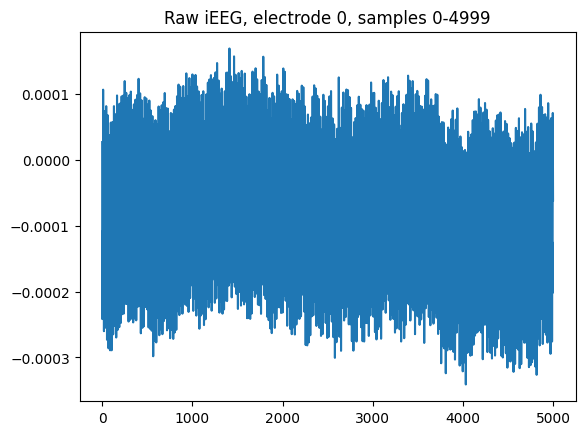

In [10]:
# Sanity check one channel data

plt.plot(mne_data._data[0,:4999])
plt.title("Raw iEEG, electrode 0, samples 0-4999")
plt.show()

### Resampling data 

In [11]:
#resampling if patient is not sampled at 512
resample_sr = 500
mne_data.resample(sfreq=resample_sr, npad='auto', n_jobs=-1)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    6.9s
[Parallel(n_jobs=-1)]: Done  68 tasks      | elapsed:   11.5s
[Parallel(n_jobs=-1)]: Done 158 tasks      | elapsed:   19.3s
[Parallel(n_jobs=-1)]: Done 276 out of 276 | elapsed:   29.5s finished


<RawEDF | MS028_SWB.edf, 276 x 1071312 (2142.6 s), ~2.20 GB, data loaded>

### Photodiode
- examine photodiode 

In [1394]:
# Sanity check the photodiode
trig_ix = mne_data.ch_names.index("DC1")
plt.plot(mne_data._data[trig_ix])
plt.title("Photodiode")
plt.show()

NameError: name 'mne_data' is not defined

In [13]:
mne_data.save(f'{neural_dir}{subj_id}/photodiode.fif', picks='DC1', overwrite=True)

Writing /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS028/photodiode.fif
Closing /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS028/photodiode.fif
[done]


In [14]:
mne_data.drop_channels(['DC1'])

<RawEDF | MS028_SWB.edf, 275 x 1071312 (2142.6 s), ~2.20 GB, data loaded>

### Notch filter line noise

In [15]:
mne_data.info['line_freq'] = 60
# Notch out 60 Hz noise and harmonics 
mne_data.notch_filter(freqs=(60, 120, 180, 240))

Setting up band-stop filter

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandstop filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower transition bandwidth: 0.50 Hz
- Upper transition bandwidth: 0.50 Hz
- Filter length: 3301 samples (6.602 sec)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 275 out of 275 | elapsed:   10.3s finished


<RawEDF | MS028_SWB.edf, 275 x 1071312 (2142.6 s), ~2.20 GB, data loaded>

### Anatomical Localization

In [16]:
### Rename channels to be lowercase before anatomical localization
new_name_dict = {x:x.replace(" ", "").lower() for x in mne_data.ch_names}
mne_data.rename_channels(new_name_dict)

<RawEDF | MS028_SWB.edf, 275 x 1071312 (2142.6 s), ~2.20 GB, data loaded>

In [17]:
# Load the electrode localization data
anat_file = glob(f'{anat_dir}{subj_id}_labels.csv')[0]
elec_locs = pd.read_csv(anat_file)
# Sometimes there's extra columns with no entries: 
elec_locs = elec_locs[elec_locs.columns.drop(list(elec_locs.filter(regex='Unnamed')))]

elec_locs

,label,BN246label,x,y,z,mni_x,mni_y,mni_z,gm,NMM,Anat,AnatMacro,BN246,YBA_1,ManualExamination,Notes
0,LAglT1,mAmyg_L,-22.353151,11.990105,-12.842655,-24.030008,-2.466548,-21.004349,Gray,Left Amygdala,Amygdala (LB),L Amygdala,L Amyg,Left amygdala superior,NaN,NaN
1,LAglT2,lAmyg_L,-27.152578,11.990105,-11.243587,-29.338226,-2.282588,-19.243495,Gray,Left Ent entorhinal area,Amygdala (LB),L Amygdala,L Amyg,Left amygdala superior,NaN,NaN
2,LAglT3,Unknown,-31.952006,12.389775,-10.044287,-34.646184,-1.732659,-18.001756,White,Left Cerebral White Matter,Unknown,Unknown,Unknown,Unknown,WM,NaN
3,LAglT4,vId/vIg_L,-36.751433,12.389775,-8.445219,-39.885009,-1.486931,-16.129432,Gray,Left PIns posterior insula,Area Id1,L Superior Temporal Gyrus,L INS,Left superior temporal gyrus A,NaN,NaN
4,LAglT5,A38l_L,-41.550861,12.789446,-7.245918,-45.108698,-0.767422,-14.632926,Gray,Left PP planum polare,Unknown,L Superior Temporal Gyrus,L STG,Left superior temporal gyrus A,NaN,Borderline
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
161,RmOlF9,A44op_R,35.639932,35.170976,11.942894,39.015475,30.366030,0.328881,Gray,Right TrIFG triangular part of the inferior fr...,Unknown,R IFG (p Triangularis),R IFG,Right anterior pars triangularis B,NaN,NaN
162,uLAglT,rHipp_L,-17.953676,11.190765,-14.041956,-19.136886,-3.331668,-22.148985,Gray,Left Amygdala,Amygdala (LB),L Hippocampus,L Hipp,Left amygdala inferior,NaN,NaN
163,uLmOlF,A13_L,-7.554916,38.768008,-10.044287,-8.831674,27.220768,-22.979829,Gray,Left GRe gyrus rectus,Area Fo2,L Rectal Gyrus,L OrG,Left frontal orbital 5 A,NaN,NaN
164,uRAglT,mAmyg_R,18.042031,7.993403,-12.043121,19.030036,-5.166208,-20.077131,Gray,Right Amygdala,Amygdala (SF),R ParaHippocampal Gyrus,R Amyg,Right amygdala superior,NaN,NaN


In [18]:
list(elec_locs.label)

['LAglT1',
 'LAglT2',
 'LAglT3',
 'LAglT4',
 'LAglT5',
 'LAglT6',
 'LAglT7',
 'LAglT8',
 'LAglT9',
 'LCMmM1',
 'LCMmM10',
 'LCMmM11',
 'LCMmM12',
 'LCMmM13',
 'LCMmM14',
 'LCMmM2',
 'LCMmM3',
 'LCMmM4',
 'LCMmM5',
 'LCMmM6',
 'LCMmM7',
 'LCMmM8',
 'LCMmM9',
 'LHplT1',
 'LHplT10',
 'LHplT2',
 'LHplT3',
 'LHplT4',
 'LHplT5',
 'LHplT6',
 'LHplT7',
 'LHplT8',
 'LHplT9',
 'LaCaS1',
 'LaCaS10',
 'LaCaS11',
 'LaCaS12',
 'LaCaS2',
 'LaCaS3',
 'LaCaS4',
 'LaCaS5',
 'LaCaS6',
 'LaCaS7',
 'LaCaS8',
 'LaCaS9',
 'LaIpS1',
 'LaIpS10',
 'LaIpS11',
 'LaIpS12',
 'LaIpS13',
 'LaIpS14',
 'LaIpS15',
 'LaIpS16',
 'LaIpS2',
 'LaIpS3',
 'LaIpS4',
 'LaIpS5',
 'LaIpS6',
 'LaIpS7',
 'LaIpS8',
 'LaIpS9',
 'LmCmS1',
 'LmCmS10',
 'LmCmS2',
 'LmCmS3',
 'LmCmS4',
 'LmCmS5',
 'LmCmS6',
 'LmCmS7',
 'LmCmS8',
 'LmCmS9',
 'LmOlF1',
 'LmOlF2',
 'LmOlF3',
 'LmOlF4',
 'LmOlF5',
 'LmOlF6',
 'LmOlF7',
 'LmOlF8',
 'LmOlF9',
 'RAglT1',
 'RAglT2',
 'RAglT3',
 'RAglT4',
 'RAglT5',
 'RAglT6',
 'RAglT7',
 'RAglT8',
 'RAglT9',
 'RC

In [19]:
anat_names = list(elec_locs.label.str.lower())
sum([ch not in mne_data.ch_names for ch in anat_names]) #if there are no missing channels, sum = 0. if sum >0, find the missing elecs
print([ch for ch in mne_data.ch_names if ch not in anat_names ]) #print extra channels in mne_data.ch_names and make sure none of them are neural channels (will be EEG etc.)

['lalps1', 'lalps2', 'lalps3', 'lalps4', 'lalps5', 'lalps6', 'lalps7', 'lalps8', 'lalps9', 'lalps10', 'lalps11', 'lalps12', 'lalps13', 'lalps14', 'lalps15', 'lalps16', 'c63', 'c64', 'rlms1', 'rlms2', 'rlms3', 'rlms4', 'rlms5', 'rlms6', 'rlms7', 'rlms8', 'rlms9', 'rlms10', 'rlms11', 'rlms12', 'rlms13', 'rlms14', 'rlms15', 'rlms16', 'c127', 'c128', 'fp1', 'f7', 't3', 't5', 'o1', 'f3', 'c3', 'p3', 'fp2', 'f8', 't4', 't6', 'o2', 'f4', 'c4', 'p4', 'fz', 'cz', 'pz', 'ekg1', 'ekg2', 'abs1', 'abs2', 'chest1', 'chest2', 'c192', 'c193', 'c194', 'c195', 'c196', 'c197', 'c198', 'c199', 'c200', 'c201', 'c202', 'c203', 'c204', 'c205', 'c206', 'c207', 'c208', 'c209', 'c210', 'c211', 'c212', 'c213', 'c214', 'c215', 'c216', 'c217', 'c218', 'c219', 'c220', 'c221', 'c222', 'c223', 'c224', 'c225', 'c226', 'c227', 'c228', 'c229', 'c230', 'c231', 'c232', 'c233', 'c234', 'c235', 'c236', 'c237', 'c238', 'c239', 'c240', 'c241', 'c242', 'c243', 'c244', 'c245', 'c246', 'c247', 'c248', 'c249', 'c250', 'c251', 'c2

In [20]:
new_mne_names, unmatched_names, unmatched_seeg = lfp_preprocess_utils.match_elec_names(mne_data.ch_names, elec_locs.label)


Number of electrodes in the mne file is greater than the number of electrodes in the localization file


In [21]:
unmatched_seeg #make sure there are no unmatched names


[]

In [22]:
new_name_dict = {x:y for (x,y) in zip(mne_data.ch_names, new_mne_names)}


In [23]:
new_name_dict #make sure this passes the eye test 


{'lmolf1': 'lmolf1',
 'lmolf2': 'lmolf2',
 'lmolf3': 'lmolf3',
 'lmolf4': 'lmolf4',
 'lmolf5': 'lmolf5',
 'lmolf6': 'lmolf6',
 'lmolf7': 'lmolf7',
 'lmolf8': 'lmolf8',
 'lmolf9': 'lmolf9',
 'rmolf1': 'rmolf1',
 'rmolf2': 'rmolf2',
 'rmolf3': 'rmolf3',
 'rmolf4': 'rmolf4',
 'rmolf5': 'rmolf5',
 'rmolf6': 'rmolf6',
 'rmolf7': 'rmolf7',
 'rmolf8': 'rmolf8',
 'rmolf9': 'rmolf9',
 'lcmmm1': 'lcmmm1',
 'lcmmm2': 'lcmmm2',
 'lcmmm3': 'lcmmm3',
 'lcmmm4': 'lcmmm4',
 'lcmmm5': 'lcmmm5',
 'lcmmm6': 'lcmmm6',
 'lcmmm7': 'lcmmm7',
 'lcmmm8': 'lcmmm8',
 'lcmmm9': 'lcmmm9',
 'lcmmm10': 'lcmmm10',
 'lcmmm11': 'lcmmm11',
 'lcmmm12': 'lcmmm12',
 'lcmmm13': 'lcmmm13',
 'lcmmm14': 'lcmmm14',
 'rcmmm1': 'rcmmm1',
 'rcmmm2': 'rcmmm2',
 'rcmmm3': 'rcmmm3',
 'rcmmm4': 'rcmmm4',
 'rcmmm5': 'rcmmm5',
 'rcmmm6': 'rcmmm6',
 'rcmmm7': 'rcmmm7',
 'rcmmm8': 'rcmmm8',
 'rcmmm9': 'rcmmm9',
 'rcmmm10': 'rcmmm10',
 'rcmmm11': 'rcmmm11',
 'rcmmm12': 'rcmmm12',
 'rcmmm13': 'rcmmm13',
 'rcmmm14': 'rcmmm14',
 'lalps1': 'la

In [24]:
# Rename the mne data according to the localization data

mne_data.rename_channels(new_name_dict)

<RawEDF | MS028_SWB.edf, 275 x 1071312 (2142.6 s), ~2.20 GB, data loaded>

In [25]:
right_seeg_names = [i for i in mne_data.ch_names if i.startswith('r')]
left_seeg_names = [i for i in mne_data.ch_names if i.startswith('l')]
print(f'We have a total of {len(left_seeg_names)} left sEEG and {len(right_seeg_names)} right sEEG electrodes')
print(f'We have a total of {len(left_seeg_names) + len(right_seeg_names)} sEEG electrodes')



We have a total of 80 left sEEG and 82 right sEEG electrodes
We have a total of 162 sEEG electrodes


In [26]:
sEEG_mapping_dict = {f'{x}':'seeg' for x in left_seeg_names+right_seeg_names}
mne_data.set_channel_types(sEEG_mapping_dict)


<RawEDF | MS028_SWB.edf, 275 x 1071312 (2142.6 s), ~2.20 GB, data loaded>

In [27]:
drop_chans = list(set(mne_data.ch_names)^set(left_seeg_names+right_seeg_names))
mne_data.drop_channels(drop_chans) #number of chans should = number of seegs 

<RawEDF | MS028_SWB.edf, 162 x 1071312 (2142.6 s), ~1.29 GB, data loaded>

In [28]:
# make montage (convert mm to m)

montage = mne.channels.make_dig_montage(ch_pos=dict(zip(elec_locs.label, 
                                                        elec_locs[['mni_x', 'mni_y', 'mni_z']].to_numpy(dtype=float)/1000)),
                                        coord_frame='mni_tal')

mne_data.set_montage(montage, match_case=False, on_missing='warn')

<RawEDF | MS028_SWB.edf, 162 x 1071312 (2142.6 s), ~1.29 GB, data loaded>

## Signal Cleaning 
Methods:
- Use manual bad channel detection for **bipolar** referencing
    - bipolar referencing completely ignores channels labeled as 'bad' so do not remove unless absolutely necessary
    - remove ch if there is massive artifact in a channel not in the rest of probe 
    - if entire probe shows same artifact try to keep
- Remove additional channels as needed
- This process is iterative depending on how TFRs look. 

In [29]:
#this is just for my own personal info and to select how many channels to visualize at a time
ch_names = list(elec_locs.label.str.lower())
pattern = '[0-9]'
ch_names_no_num = [re.sub(pattern, '', i) for i in ch_names]
probe_names = np.unique(ch_names_no_num)
# probe_names

In [30]:
probe_ch_counts = {} #need this to select channel number for visualization
for p in probe_names:
    c = ch_names_no_num.count(p)
    probe_ch_counts[p] = c

In [31]:
probe_ch_counts

{'lacas': 12,
 'laglt': 9,
 'laips': 16,
 'lcmmm': 14,
 'lhplt': 10,
 'lmcms': 10,
 'lmolf': 9,
 'racas': 14,
 'raglt': 9,
 'rcmmm': 14,
 'rhplt': 10,
 'rims': 16,
 'rmcms': 10,
 'rmolf': 9,
 'ulaglt': 1,
 'ulmolf': 1,
 'uraglt': 1,
 'urmolf': 1}

### Compare auto detection result to actual lfp data - if trusted save auto result as mne bads
- often inaccurate - verify that all included channels make sense and all channels that should be included are
- take out any crazy noise, especially if it's only in one channel on probe (won't be cancelled out)

In [32]:
# mne_data.info['bads'] = lfp_preprocess_utils.detect_bad_elecs(mne_data, sEEG_mapping_dict) #this is likely inaccurate - just use to get an idea 
lfp_preprocess_utils.detect_bad_elecs(mne_data, sEEG_mapping_dict)

['laips6', 'lcmmm8', 'lcmmm9', 'raglt8', 'rmcms8']

<IPython.core.display.Javascript object>


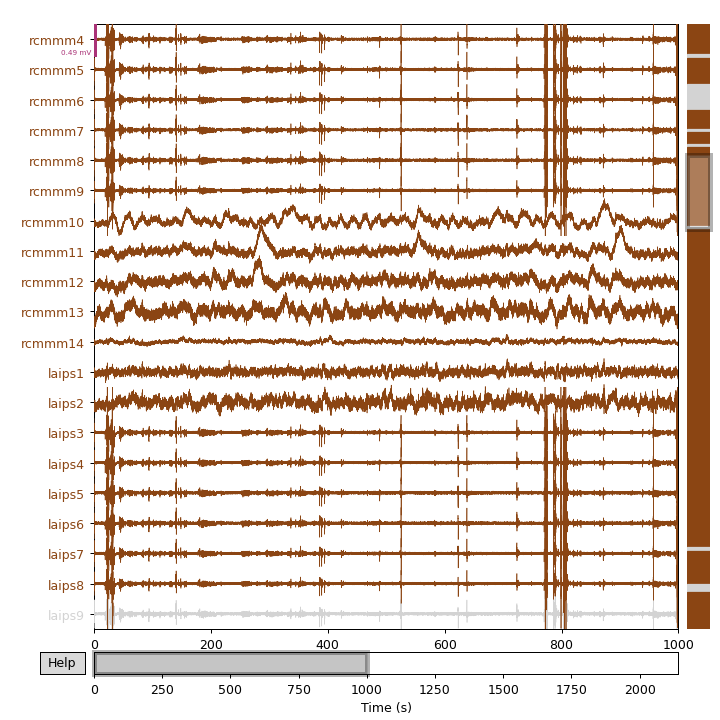

In [11]:
 %matplotlib notebook
fig = mne_data.plot(start=0, duration=1000, n_channels=20, scalings=mne_data._data.max()/50)


Effective window size : 0.512 (s)


<IPython.core.display.Javascript object>


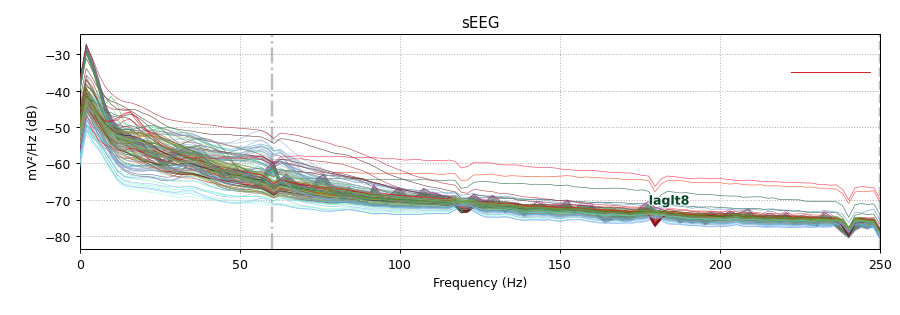

<IPython.core.display.Javascript object>


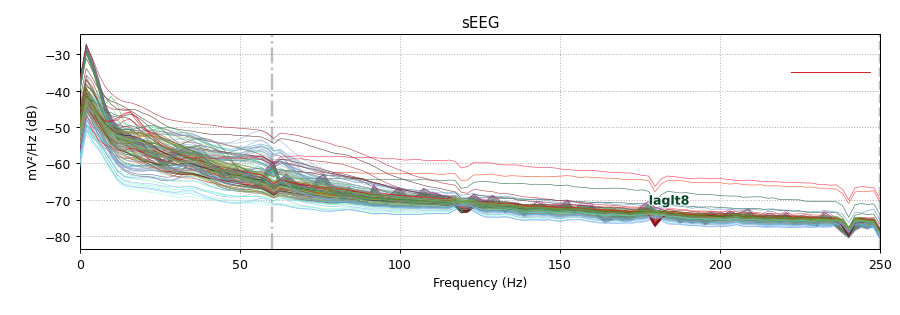

In [12]:
mne_data.compute_psd().plot()

In [13]:
mne_data.info['bads']

['lmolf9',
 'rmolf8',
 'rmolf9',
 'lcmmm1',
 'lcmmm2',
 'lcmmm3',
 'lcmmm4',
 'lcmmm5',
 'rcmmm1',
 'lcmmm11',
 'raglt8',
 'lhplt9',
 'lhplt10',
 'laips9']

In [14]:
mne_data.info #sanity check that bads info saved

<Info | 12 non-empty values
 bads: 14 items (lmolf9, rmolf8, rmolf9, lcmmm1, lcmmm2, lcmmm3, ...)
 ch_names: lmolf1, lmolf2, lmolf3, lmolf4, lmolf5, lmolf6, lmolf7, lmolf8, ...
 chs: 162 sEEG
 custom_ref_applied: False
 dig: 162 items (162 EEG)
 file_id: 4 items (dict)
 highpass: 0.0 Hz
 line_freq: 60.0
 lowpass: 250.0 Hz
 meas_date: 2001-01-01 10:31:03 UTC
 meas_id: 4 items (dict)
 nchan: 162
 projs: []
 sfreq: 500.0 Hz
>

# Bipolar Re-referencing 
- plot lfp bp data
- plot psd bp data
- save bp reref data 


In [49]:
#run if only re-ref
anat_file = glob(f'{anat_dir}/{subj_id}_labels.csv')[0]
# mne_data = mne.io.read_raw_fif(f'{neural_dir}{subj_id}/raw_ieeg.fif', preload=True)

### Bipolar Re-ref

In [15]:
# Re-reference neural data
mne_data_bp_reref = lfp_preprocess_utils.ref_mne(mne_data=mne_data, 
                                              elec_path=anat_file, 
                                              method='bipolar', 
                                              site='MSSM')

NameError: name 'anat_file' is not defined

In [16]:
mne_data_bp_reref

<Raw | bp_ref_ieeg.fif, 49 x 1071312 (2142.6 s), ~400.6 MB, data loaded>

In [17]:
mne_data_bp_reref.ch_names

['laglt1-laglt2',
 'laglt4-laglt5',
 'laglt7-laglt8',
 'lhplt1-lhplt2',
 'lhplt2-lhplt3',
 'lhplt3-lhplt4',
 'lacas4-lacas5',
 'lacas5-lacas6',
 'laips1-laips2',
 'laips2-laips3',
 'laips3-laips4',
 'laips12-laips13',
 'lmcms1-lmcms2',
 'lmcms2-lmcms3',
 'lmcms3-lmcms4',
 'lmolf3-lmolf4',
 'raglt1-raglt2',
 'raglt5-raglt6',
 'raglt6-raglt7',
 'rcmmm2-rcmmm3',
 'rcmmm3-rcmmm4',
 'rcmmm4-rcmmm5',
 'rcmmm5-rcmmm6',
 'rhplt1-rhplt2',
 'rhplt2-rhplt3',
 'rhplt5-rhplt6',
 'rhplt6-rhplt7',
 'rhplt7-rhplt8',
 'rhplt8-rhplt9',
 'rims1-rims2',
 'rims2-rims3',
 'rims3-rims4',
 'rims4-rims5',
 'rims11-rims12',
 'rims12-rims13',
 'rims13-rims14',
 'racas1-racas2',
 'racas4-racas5',
 'racas5-racas6',
 'racas6-racas7',
 'racas7-racas8',
 'racas10-racas11',
 'rmcms3-rmcms4',
 'rmcms4-rmcms5',
 'rmcms8-rmcms9',
 'rmolf1-rmolf2',
 'rmolf2-rmolf3',
 'rmolf3-rmolf4',
 'rmolf4-rmolf5']

#### Examine bp ref data 
- examine lfp plot to see if major artifacts are still present
- examine psd to see if there are any major peaks in channels

<IPython.core.display.Javascript object>


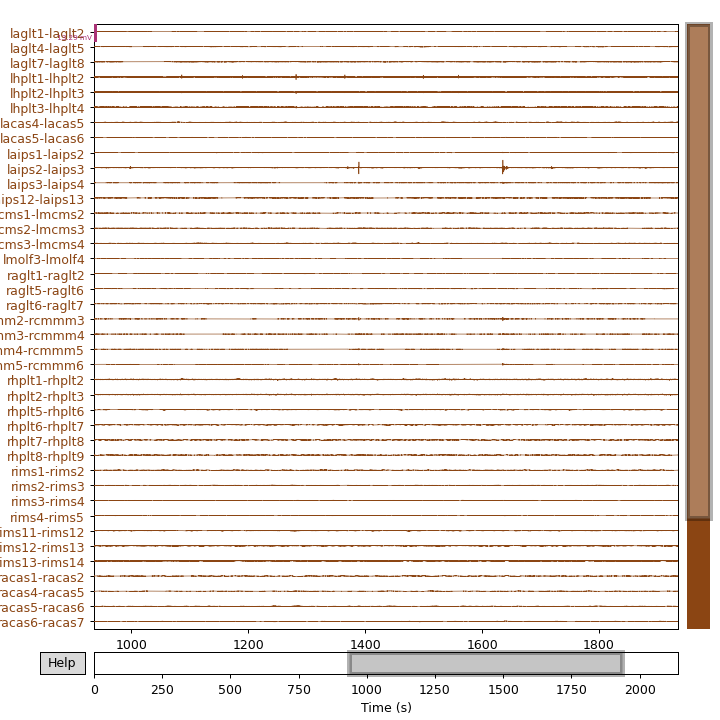

In [18]:
 %matplotlib notebook
fig = mne_data_bp_reref.plot(start=0, duration=1000, n_channels=40, scalings=mne_data_bp_reref._data.max())


Effective window size : 0.512 (s)


<IPython.core.display.Javascript object>


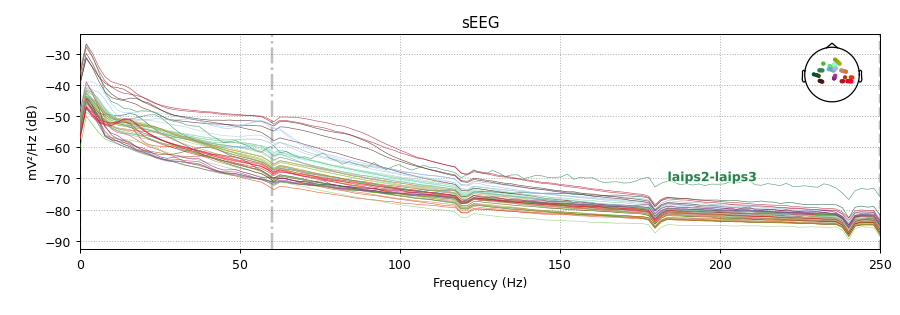

<IPython.core.display.Javascript object>


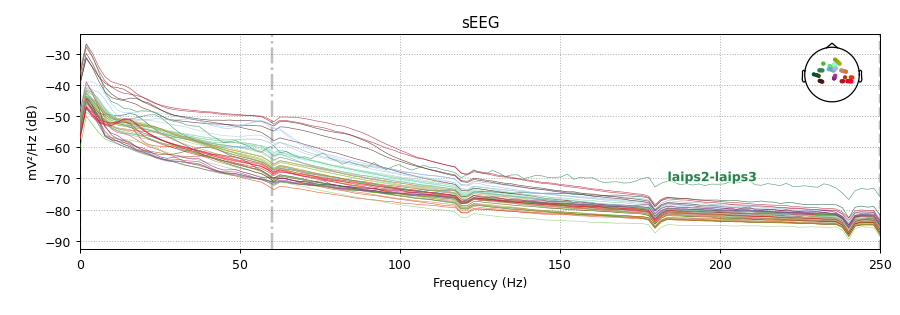

In [10]:
mne_data_bp_reref.compute_psd().plot()

In [19]:
mne_data_bp_reref.save(f'{neural_dir}{subj_id}/bp_ref_ieeg.fif',overwrite=True)

Overwriting existing file.
Writing /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS028/bp_ref_ieeg.fif
Closing /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS028/bp_ref_ieeg.fif
[done]


## Save mne_data

In [20]:
mne_data.save(f'{neural_dir}{subj_id}/raw_ieeg.fif',overwrite=True)

Overwriting existing file.
Writing /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS028/raw_ieeg.fif
Closing /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS028/raw_ieeg.fif
[done]


# Epoching + TFRs
- Check whether data is ready to be analyzed - if this step shows noise then steps above should be repeated
- Align photodiode to behavior 
- Epoch data (and mark bad epochs)
- Baseline data
- Visualize TFRs 

In [21]:
#remove mne_data from environment to save memory 
del mne_data, mne_data_bp_reref

### Photodiode Alignment

In [8]:
#load behavior data
behav_df = pd.read_csv(f'{behav_dir}{subj_id}_pt_task_data')
behav_df = behav_df[behav_df.columns.drop(list(behav_df.filter(regex='Unnamed')))]
# behav_df = behav_df[behav_df['FeedbackOnset'] != 0] #remove fail trials from behav df
beh_ts = behav_df['TrialOnset'] #timestamp that should be aligned to photodiode 
#load photodiode data
photodiode_data = mne.io.read_raw_fif(f'{neural_dir}{subj_id}/photodiode.fif', preload=True)

Opening raw data file /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS028/photodiode.fif...
Isotrak not found
    Range : 0 ... 1071311 =      0.000 ...  2142.622 secs
Ready.
Reading 0 ... 1071311  =      0.000 ...  2142.622 secs...


In [9]:
photodiode_data

<Raw | photodiode.fif, 1 x 1071312 (2142.6 s), ~8.2 MB, data loaded>

In [24]:
temp_diode = photodiode_data.copy()

In [13]:
temp_diode = photodiode_data.copy()
temp_data = temp_diode._data[0,:]
temp_data[temp_data>0.8] = -2
temp_data[0:450000] = 0
temp_data[570000:] = 0
# temp_data[temp_data>4000] = 0
# temp_data = np.abs(temp_data-np.nanmax(temp_data)) #consider resaving photodiode 
# temp_data = np.abs(temp_diode._data[0, :])
# temp_data[0:1250000] = 0
temp_diode._data = temp_data

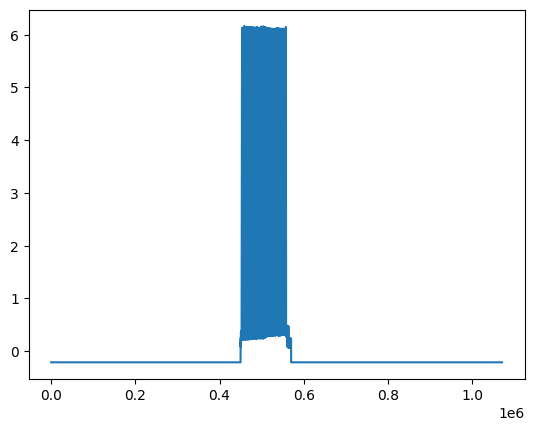

In [16]:
# plt.plot(scipy.stats.zscore(photodiode_data._data[0,:]))
# plt.plot(photodiode_data._data[0,:])
# plt.plot(photodiode_data._data[0,440000:580000])
# plt.plot(scipy.stats.zscore(temp_diode._data[:]))
# plt.plot(temp_data[:])
plt.plot(scipy.stats.zscore(temp_diode._data[:]))
plt.show()

In [1370]:
np.max(scipy.stats.zscore(photodiode_data._data[0,:]))

5.835689250505891

In [693]:
temp_diode = photodiode_data.copy()
# temp_data = -temp_diode._data[0,:]
temp_data = temp_diode._data[0,:]
temp_data[0:450000] = 0
temp_data[570000:] = 0
# temp_data[temp_data>4000] = 0
# temp_data = np.abs(temp_data-np.nanmax(temp_data)) #consider resaving photodiode 
# temp_data = np.abs(temp_diode._data[0, :])
# temp_data[0:1250000] = 0
temp_diode._data = temp_data

In [53]:
temp_diode2 = photodiode_data.copy()

# Specify the window size for the rolling mean
window_size = 15

# Calculate the rolling mean
rolling_mean = pd.Series(temp_diode2._data[0,:]).rolling(window=window_size).mean()

# Subtract the rolling mean from the original signal
detrended_data = temp_diode2._data[0,:] - rolling_mean

detrended_data.fillna(0, inplace=True)

detrended_data = detrended_data.values

temp_data[temp_data>0.8] = -2
# detrended_data[0:450000] = 0

# detrended_data[570000:] = 0

temp_diode2._data = detrended_data

<IPython.core.display.Javascript object>


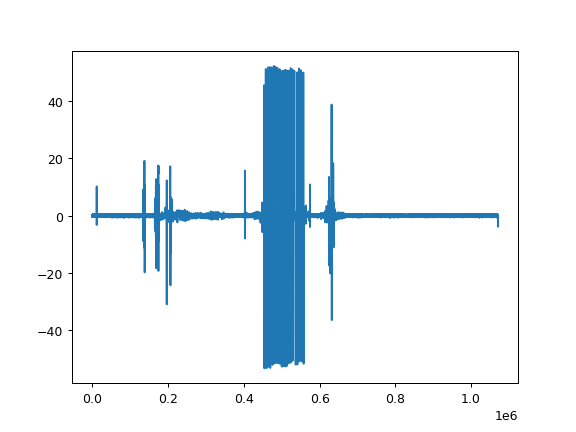

In [54]:
plt.plot(scipy.stats.zscore(detrended_data))

In [96]:
neural_ts = sync_utils.get_neural_ts_photodiode(temp_diode2, smoothSize=11, height=40)

In [97]:
len(neural_ts)

21

<IPython.core.display.Javascript object>


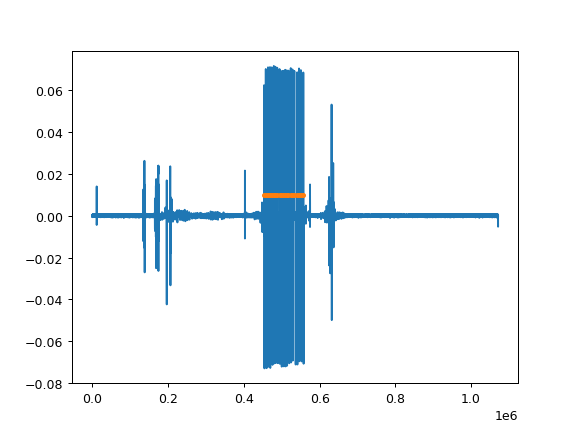

In [98]:
plt.plot(detrended_data)
plt.plot(neural_ts * photodiode_data.info['sfreq'], 0.01 * np.ones_like(neural_ts * photodiode_data.info['sfreq']),'.')
plt.show()

<IPython.core.display.Javascript object>


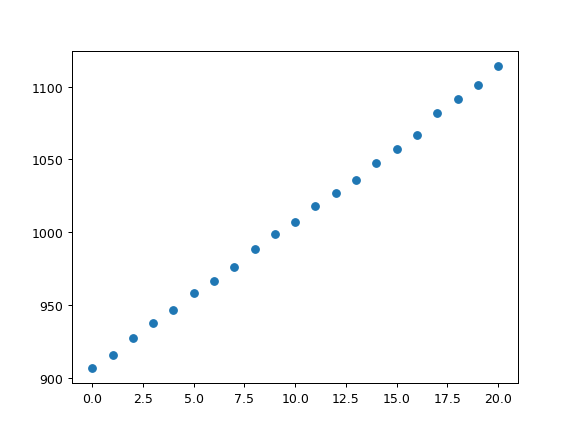

In [99]:
plt.plot(neural_ts, 'o')

In [100]:
temp_diode = photodiode_data.copy()
# temp_data = -temp_diode._data[0,:]
temp_data = temp_diode._data[0,:]
# temp_data[0:450000] = 0
# temp_data[570000:] = 0
temp_data[temp_data>0.8] = -2
# temp_data[temp_data>4000] = 0
# temp_data = np.abs(temp_data-np.nanmax(temp_data)) #consider resaving photodiode 
# temp_data = np.abs(temp_diode._data[0, :])
# temp_data[0:1250000] = 0
temp_diode._data = temp_data

<IPython.core.display.Javascript object>


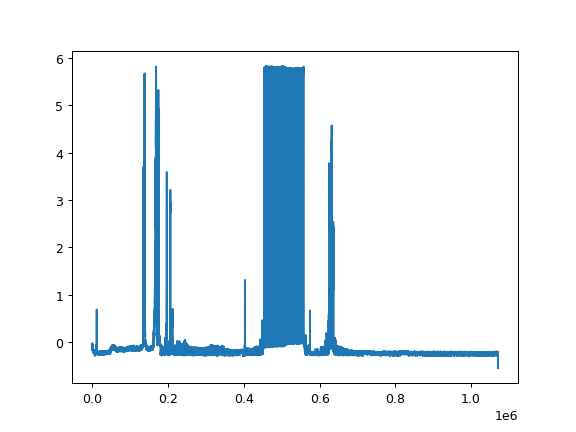

In [101]:
plt.plot(scipy.stats.zscore(temp_data))

In [105]:
np.max(scipy.stats.zscore(temp_data))

5.835689250505891

In [21]:
### Photodiode alignment
smoothSize=11
windSize=20

height=1

# Synchronize to the photodiode or whatever your neural sync signal is
slope, offset = sync_utils.synchronize_data(beh_ts, 
                                            photodiode_data, #
                                            smoothSize, windSize, height)

2 blocks
..

found matches for 0 of 46 pulses
fast sync failed - running robust sync now
......

KeyError: 0

In [19]:
print(slope, offset,smoothSize,windSize,height) #photodiode data

1.0442671283155016 -1089.9839674040634 11 10 1


In [115]:
print(slope, offset,smoothSize,windSize,height) #temp data

1.0055555472666495 16.779254283124033 11 5 5.35


In [954]:
print(slope, offset,smoothSize,windSize,height) #photodiode data

0.986939060537322 15.08611124354934 21 9 3.5


In [731]:
print(slope, offset,smoothSize,windSize,height) #tempdiode 

1.0055513652023966 16.785637358611098 11 5 5.79


In [209]:
[(x*slope + offset) for x in beh_ts]

[438.6206464609025,
 448.78104426844595,
 458.0013464477522,
 471.4877388191395,
 479.174969575432,
 489.4072234490723,
 499.99946045823054,
 510.87037297295484,
 521.5501966668529,
 535.359604552023,
 546.312219116022,
 554.41375323382,
 565.7000595487366,
 574.2427310375726,
 582.6837155920815,
 593.5633588007158,
 603.8773682170721,
 612.3893710976878,
 624.0866067621125,
 634.4795727697231,
 643.3341464011593,
 653.9457216783405,
 662.4318214042702,
 671.8436332702239,
 692.4825357293994,
 702.3677330434754,
 713.6912359268882,
 724.2516963242884,
 734.6081749576831,
 744.3899703364207,
 758.1007173888012,
 766.3568491609304,
 776.8989031438805,
 802.5559740143837,
 813.8195956952726,
 823.8662869936678,
 835.4223824285981,
 845.7078163874477,
 854.0146313948201,
 865.1149389991706,
 875.0001693479004,
 883.9730776145809,
 895.9379579502967,
 905.6802243839427,
 916.5363297496858,
 927.8734464476173,
 937.2567078065646,
 947.3361185479158,
 958.9287344911703,
 967.4672948293728,
 9

In [1094]:
[(x*slope + offset) for x in beh_ts]

[424.9092955839508,
 434.9568991637492,
 444.0748434547533,
 457.41151853736795,
 465.01341058221647,
 475.1320725280968,
 485.6067213073283,
 496.35695191518164,
 506.91821504788675,
 520.5743197329728,
 531.4053453862879,
 539.4169414621238,
 550.5779544342994,
 559.025790656671,
 567.37306880792,
 578.1319331871125,
 588.3314430780459,
 596.7489511554394,
 608.3163316027249,
 618.5939215594157,
 627.3501973866038,
 637.8439697527947,
 646.235862235732,
 655.5431901955229,
 675.9529727808034,
 685.7284309667205,
 696.9262275749169,
 707.3694525059782,
 717.6109601479079,
 727.2841643005337,
 740.8427034221941,
 749.0071809082375,
 759.4322037610708,
 784.8044462665971,
 795.9430264350203,
 805.8781858024952,
 817.3059928687001,
 827.4772445285505,
 835.691842597027,
 846.6689216971711,
 856.4444125510124,
 865.317709338129,
 877.149763237017,
 886.7838772695776,
 897.5194651079324,
 908.7307243987997,
 918.0098188010235,
 927.9773343811586,
 939.4412565283991,
 947.885027239498,
 956

In [732]:
[(x*slope + offset) for x in beh_ts]

[434.33901256018567,
 444.57606634398127,
 453.8659318689638,
 467.45407346247123,
 475.1993011780817,
 485.5087531521115,
 496.18090418471763,
 507.1338332136919,
 517.8942317361511,
 531.8078258611667,
 542.8430733474016,
 551.0057301710921,
 562.3771869737394,
 570.9843093664851,
 579.4889776392707,
 590.45070323161,
 600.8425275599275,
 609.4187499625573,
 621.2042364057697,
 631.6756130199884,
 640.5969907272956,
 651.288625927115,
 659.8387497465286,
 669.3215698191051,
 690.1161842146387,
 700.0759612316858,
 711.4848952354705,
 722.1250299149972,
 732.5596438729347,
 742.4152388300411,
 756.2294277673118,
 764.5478486203459,
 775.1694380166797,
 801.020080817397,
 812.3686818398862,
 822.491171246207,
 834.1344526155867,
 844.4974858964537,
 852.8669723686642,
 864.0510271778218,
 874.0108374787555,
 883.0514426069204,
 895.1065929891686,
 904.9223607717308,
 915.8603709379425,
 927.2830214668151,
 936.7370756306823,
 946.8925313345499,
 958.5726087443019,
 967.1755889694922,
 

In [1184]:
del epochs_all_baseline, power_epochs, plot_data

## Epoch Data
- Epoch neural data into trial epochs 
- Add behavioral data to epochs metadata
- Save epochs
- Baseline + decompose data into TFRs
- Plot + save TFRs (examine quality)

### Epoch data

In [210]:
# IED removal requires that we set some parameters for IED detection. 
# 1. peak_thresh: how many stds should they exceed the baseline by? 
# 2. closeness_thresh: how close should they be allowed to be (in sec) to other candidate IEDs? 
# 3. width_thresh: how wide should they have to be (in sec)?

# Defaults:
IED_args = {'peak_thresh':4,
           'closeness_thresh':0.25, 
           'width_thresh':0.2}

In [211]:
# Create a dictionary with your event name (matching your dataframe), and the time-window for the event
evs = {'TrialOnset': [-1.0, 0], #ITI is always at least one second + 10ms buffer for wavelet padding (no horizontal smearing)
       'DecisionOnset': [0, 5.0]} #1 sec decision period + 2 second outcome + 3 second counterfactual

In [212]:
epochs_all_evs = {f'{x}': np.nan for x in evs}
print(offset)

24.193948357003023


In [213]:
for event in evs.keys():
    # Make the epochs. 
    ev_epochs = lfp_preprocess_utils.make_epochs(load_path=f'{neural_dir}{subj_id}/bp_ref_ieeg.fif', 
                 slope=slope, offset=offset,
                 behav_name=event, behav_times=behav_df[event].values, 
                 ev_start_s=evs[event][0], ev_end_s=evs[event][1], buf_s = 1.0, IED_args=IED_args) #1.0 buf unsaved

    epochs_all_evs[event] = ev_epochs
    

Opening raw data file /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS028/bp_ref_ieeg.fif...
    Range : 0 ... 1071311 =      0.000 ...  2142.622 secs
Ready.
Reading 0 ... 1071311  =      0.000 ...  2142.622 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 25 - 80 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 25.00
- Lower transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 21.88 Hz)
- Upper passband edge: 80.00 Hz
- Upper transition bandwidth: 20.00 Hz (-6 dB cutoff frequency: 90.00 Hz)
- Filter length: 265 samples (0.530 sec)



[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    2.1s
[Parallel(n_jobs=-1)]: Done  49 out of  49 | elapsed:    3.0s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  14 tasks      | elapsed:    0.9s
[Parallel(n_jobs=-1)]: Done  46 out of  49 | elapsed:    2.0s remaining:    0.1s
[Parallel(n_jobs=-1)]: Done  49 out of  49 | elapsed:    2.0s finished


Used Annotations descriptions: ['TrialOnset']
Not setting metadata
150 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 150 events and 1501 original time points ...
0 bad epochs dropped
Adding metadata with 49 columns
Opening raw data file /sc/arion/projects/guLab/Alie/SWB/ephys_analysis/data/MS028/bp_ref_ieeg.fif...
    Range : 0 ... 1071311 =      0.000 ...  2142.622 secs
Ready.
Reading 0 ... 1071311  =      0.000 ...  2142.622 secs...
Filtering raw data in 1 contiguous segment
Setting up band-pass filter from 25 - 80 Hz

FIR filter parameters
---------------------
Designing a one-pass, zero-phase, non-causal bandpass filter:
- Windowed time-domain design (firwin) method
- Hamming window with 0.0194 passband ripple and 53 dB stopband attenuation
- Lower passband edge: 25.00
- Lower transition bandwidth: 6.25 Hz (-6 dB cutoff frequency: 21.88 Hz)
- Upper passband edge: 80.00 Hz
- Upper transition bandwidth: 20.00 Hz (-

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  36 tasks      | elapsed:    1.2s
[Parallel(n_jobs=-1)]: Done  49 out of  49 | elapsed:    1.4s finished
[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  24 tasks      | elapsed:    1.0s
[Parallel(n_jobs=-1)]: Done  49 out of  49 | elapsed:    1.7s finished


Used Annotations descriptions: ['DecisionOnset']
Not setting metadata
150 matching events found
No baseline correction applied
0 projection items activated
Using data from preloaded Raw for 150 events and 3501 original time points ...
0 bad epochs dropped
Adding metadata with 49 columns


In [215]:
epochs_all_evs 


{'TrialOnset': <Epochs |  150 events (all good), -2 - 1 sec, baseline off, ~84.3 MB, data loaded, with metadata,
  'TrialOnset': 150>,
 'DecisionOnset': <Epochs |  150 events (all good), -1 - 6 sec, baseline off, ~196.4 MB, data loaded, with metadata,
  'DecisionOnset': 150>}

### Add behavioral data to metadata 

In [216]:
behav_df.columns

Index(['Round', 'Trial Num', 'TrialType', 'TrialOnset', 'ChoiceOnset',
       'DecisionOnset', 'FeedbackOnset', 'RT', 'SafeBet', 'LowBet', 'HighBet',
       'HighBetPos', 'GamblePos', 'ChoicePos', 'GambleChoice', 'Outcome',
       'Profit', 'TotalProfit', 'GambleEV', 'CR', 'choiceEV', 'RPE',
       'totalCPE', 'decisionCPE', 'totalRegret', 'decisionRegret',
       'totalRelief', 'decisionRelief', 'totalCF', 'decisionCF', 'pRPE',
       'nRPE', 'util_safe_mle', 'util_gamble_mle', 'wSafe_mle', 'wHigh_mle',
       'wLow_mle', 'p_safe_mle', 'p_gamble_mle', 'util_safe_emmap',
       'util_gamble_emmap', 'wSafe_emmap', 'wHigh_emmap', 'wLow_emmap',
       'p_safe_emmap', 'p_gamble_emmap', 'util_tCPE_mle', 'util_dCPE_mle',
       'util_tCF_mle', 'util_dCF_mle', 'util_tRegret_mle', 'util_dRegret_mle',
       'util_tRelief_mle', 'util_dRelief_mle', 'util_RPE_mle', 'util_pRPE_mle',
       'util_nRPE_mle', 'util_tCPE_emmap', 'util_dCPE_emmap', 'util_tCF_emmap',
       'util_dCF_emmap', 'util_tRegr

In [217]:
behav_params = ['TrialType','SafeBet', 'LowBet', 'HighBet','GambleChoice', 'Outcome',
       'Profit', 'TotalProfit', 'GambleEV', 'CR', 'choiceEV', 'RPE',
       'totalCPE', 'decisionCPE', 'totalRegret', 'decisionRegret',
       'totalRelief', 'decisionRelief', 'totalCF', 'decisionCF', 'pRPE',
       'nRPE', 'util_safe_mle', 'util_gamble_mle', 'wSafe_mle', 'wHigh_mle',
       'wLow_mle', 'p_safe_mle', 'p_gamble_mle', 'util_safe_emmap',
       'util_gamble_emmap', 'wSafe_emmap', 'wHigh_emmap', 'wLow_emmap',
       'p_safe_emmap', 'p_gamble_emmap', 'util_tCPE_mle', 'util_dCPE_mle',
       'util_tCF_mle', 'util_dCF_mle', 'util_tRegret_mle', 'util_dRegret_mle',
       'util_tRelief_mle', 'util_dRelief_mle', 'util_RPE_mle', 'util_pRPE_mle',
       'util_nRPE_mle', 'util_tCPE_emmap', 'util_dCPE_emmap', 'util_tCF_emmap',
       'util_dCF_emmap', 'util_tRegret_emmap', 'util_dRegret_emmap',
       'util_tRelief_emmap', 'util_dRelief_emmap', 'util_RPE_emmap',
       'util_pRPE_emmap', 'util_nRPE_emmap']

In [218]:
for event in evs.keys():

    event_metadata = epochs_all_evs[event].metadata.copy()
    
    #independent vars
    for param in behav_params: 
        event_metadata[param] = behav_df[param].tolist()

    epochs_all_evs[event].metadata = event_metadata 
    

Replacing existing metadata with 107 columns
Replacing existing metadata with 107 columns


In [219]:
epochs_all_evs[event].metadata

,laglt1-laglt2,laglt4-laglt5,laglt7-laglt8,lhplt1-lhplt2,lhplt2-lhplt3,lhplt3-lhplt4,lacas4-lacas5,lacas5-lacas6,laips1-laips2,laips2-laips3,...,util_dCPE_emmap,util_tCF_emmap,util_dCF_emmap,util_tRegret_emmap,util_dRegret_emmap,util_tRelief_emmap,util_dRelief_emmap,util_RPE_emmap,util_pRPE_emmap,util_nRPE_emmap
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.607883,-0.917844,-0.917844,0.000000,0.000000,0.607883,0.607883,0.000000,0.000000,0.000000
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,noise,NaN,...,1.747555,-0.637307,0.000000,0.000000,0.000000,2.384862,1.747555,0.637307,0.637307,0.000000
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.056892,0.000000,0.000000,-0.056892,-0.056892,0.000000,0.000000,0.000000,0.000000,0.000000
3,NaN,NaN,NaN,NaN,NaN,noise,NaN,NaN,NaN,NaN,...,0.471075,0.000000,0.243181,0.000000,0.000000,0.714256,0.471075,0.000000,0.000000,0.000000
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.249124,0.000000,0.243181,0.000000,0.000000,0.492305,0.249124,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
145,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.241587,0.469475,0.000000,-0.711062,-0.241587,0.000000,0.000000,-0.469475,0.000000,-0.469475
146,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.154117,-0.260478,-0.260478,0.000000,0.000000,0.154117,0.154117,0.000000,0.000000,0.000000
147,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0.353695,0.000000,0.343142,0.000000,0.000000,0.696837,0.353695,0.000000,0.000000,0.000000
148,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,-0.454632,0.925162,0.454632,-0.925162,-0.454632,0.000000,0.000000,-0.925162,0.000000,-0.925162


### Save raw epoched data 

In [220]:
for event in evs.keys():
    epochs_all_evs[event].save(f'{neural_dir}{subj_id}/bp_epoch_{event}.fif', overwrite=True)

Overwriting existing file.
Overwriting existing file.


### Baseline + Decompose into TFRs

In [221]:
# Explicitly define a list of analysis events and the baseline event. Should correspond to the dict
analysis_evs = ['DecisionOnset']
baseline_ev = 'TrialOnset'
evs = {'TrialOnset': [-1.0, 0], #maybe increase to full second to take cycles up to 4
       #ITI is always at least one second + 10ms buffer for wavelet padding (no horizontal smearing)
       'DecisionOnset': [0, 5.0]} #1 sec decision period + 2 second outcome + 3 second counterfactual

In [222]:
# Set some spectrogram parameters 
freqs = np.logspace(*np.log10([2, 200]), num=30)
n_cycles = 3
sr = 500.0 
buf = 1.0
buf_ix = int(buf*sr)

In [223]:
epochs_all_baseline = {} #removed unecessary 'decisiononset' empty key

In [224]:
#baseline epoch - 
event = 'TrialOnset'
epochs = epochs_all_evs[event]

good_chans = [x for x in epochs.ch_names if x not in epochs.info['bads']]
picks = [x for x in good_chans]

pow_struct = np.nan * np.ones([epochs._data.shape[0], 
                       epochs._data.shape[1], len(freqs), 
                       epochs._data.shape[-1]])

for ch_ix in np.arange(epochs._data.shape[1]): 
    ch_data = epochs._data[:, ch_ix:ch_ix+1, :]
    bad_epochs  = np.where(epochs.metadata[epochs.ch_names[ch_ix]].notnull())[0]
    good_epochs = np.delete(np.arange(ch_data.shape[0]), bad_epochs)
    ch_data = np.delete(ch_data, bad_epochs, axis=0)
    ch_pow = mne.time_frequency.tfr_array_morlet(ch_data, sfreq=epochs.info['sfreq'], 
                                        freqs=freqs, n_cycles=n_cycles, zero_mean=False, 
                                        use_fft=True, output='power', n_jobs=1)

    pow_struct[good_epochs, ch_ix, :, :] = ch_pow[:, 0, :, :]

temp_pow = mne.time_frequency.EpochsTFR(epochs.info, pow_struct, 
                                        epochs.times, freqs)
temp_pow.crop(tmin=evs[event][0], tmax=evs[event][1])

epochs_all_baseline[event] = temp_pow


Not setting metadata


In [225]:
epochs_all_baseline

{'TrialOnset': <EpochsTFR | time : [-1.000000, 0.000000], freq : [2.000000, 200.000000], epochs : 150, channels : 49, ~842.9 MB>}

In [226]:
power_epochs = {}

In [227]:
event = 'DecisionOnset'

epochs = epochs_all_evs[event]

# Let's make sure we only do this for good channels
good_chans = [x for x in epochs.ch_names if x not in epochs.info['bads']]
picks = [x for x in good_chans]

pow_struct = np.nan * np.ones([epochs._data.shape[0], 
                       epochs._data.shape[1], len(freqs), 
                       epochs._data.shape[-1]])

for ch_ix in np.arange(epochs._data.shape[1]): 
    ch_data = epochs._data[:, ch_ix:ch_ix+1, :]
    bad_epochs  = np.where(epochs.metadata[epochs.ch_names[ch_ix]].notnull())[0] 
    good_epochs = np.delete(np.arange(ch_data.shape[0]), bad_epochs)
    ch_data = np.delete(ch_data, bad_epochs, axis=0) #this is where bad epochs for ch are deleted!!
    ch_pow = mne.time_frequency.tfr_array_morlet(ch_data, sfreq=epochs.info['sfreq'], 
                                        freqs=freqs, n_cycles=n_cycles, zero_mean=False, 
                                        use_fft=True, output='power', n_jobs=1)

    pow_struct[good_epochs, ch_ix, :, :] = ch_pow[:, 0, :, :]

temp_pow = mne.time_frequency.EpochsTFR(epochs.info, pow_struct, 
                                        epochs.times, freqs)

temp_pow.crop(tmin=evs[event][0], tmax=evs[event][1])


baseline_corrected_power = lfp_preprocess_utils.baseline_trialwise_TFR(data=temp_pow.data, 
                                                  baseline_mne=epochs_all_baseline['TrialOnset'], 
                                                  mode='zscore', 
                                                  trialwise=False, ## make sure this is FALSE!
                                                  baseline_only=True)


zpow = mne.time_frequency.EpochsTFR(epochs.info, baseline_corrected_power, 
                                temp_pow.times, freqs)

zpow.metadata = epochs_all_evs[event].metadata

power_epochs[event] = zpow



Not setting metadata
Not setting metadata
Adding metadata with 107 columns


In [228]:
power_epochs['DecisionOnset']

<EpochsTFR | time : [0.000000, 5.000000], freq : [2.000000, 200.000000], epochs : 150, channels : 49, ~4.11 GB>

In [229]:
#conda install -c conda-forge h5io must install to save tfr data
power_epochs['DecisionOnset'].save(f'{neural_dir}{subj_id}/bp_pow_epochs-tfr.h5', overwrite=True)


## Plot TFRs

In [230]:
####add directory for TFRs
tfr_dir = f'{base_dir}ephys_analysis/figs/TFRs/{subj_id}/all_trials/'
os.makedirs(tfr_dir,exist_ok = True) #added so you don't have to manually make subject folders in clean_data
date = datetime.date.today().strftime('%m%d%Y')

print(date)
# mne_data_bp_reref = mne.io.read_raw_fif(f'{neural_dir}{subj_id}/bp_ref_ieeg.fif',preload=True)

01292024


In [231]:
#to reload for more cleaning if necessary
# mne_data_bp_reref = mne.io.read_raw_fif(f'{neural_dir}{subj_id}/bp_ref_ieeg.fif',preload=True)
# mne_data = mne.io.read_raw_fif(f'{neural_dir}{subj_id}/raw_ieeg.fif',preload=True)
# del epochs_all_baseline, power_epochs, plot_data

24.193948357003023


<IPython.core.display.Javascript object>


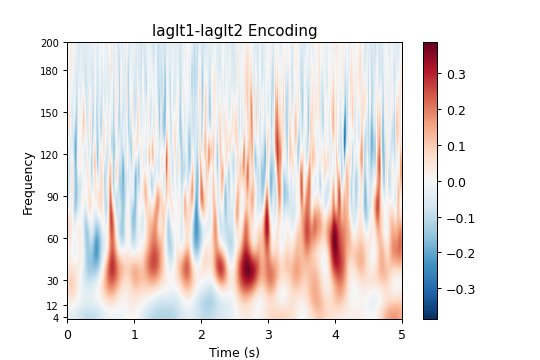

<IPython.core.display.Javascript object>


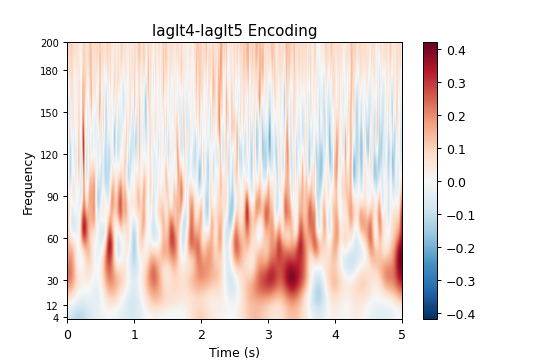

<IPython.core.display.Javascript object>


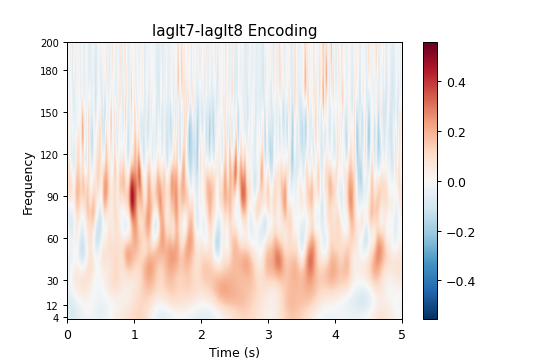

<IPython.core.display.Javascript object>


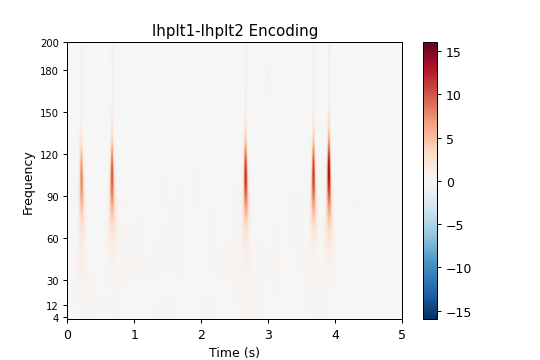

<IPython.core.display.Javascript object>


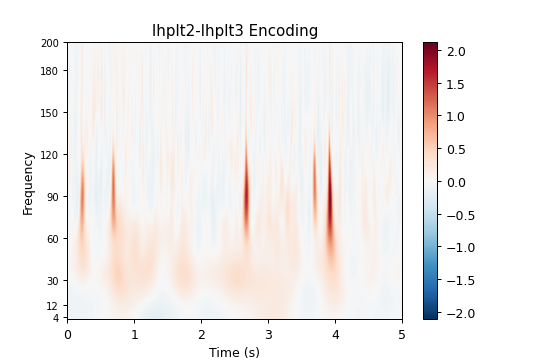

<IPython.core.display.Javascript object>


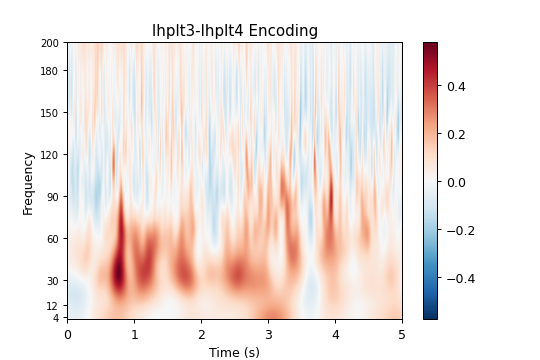

<IPython.core.display.Javascript object>


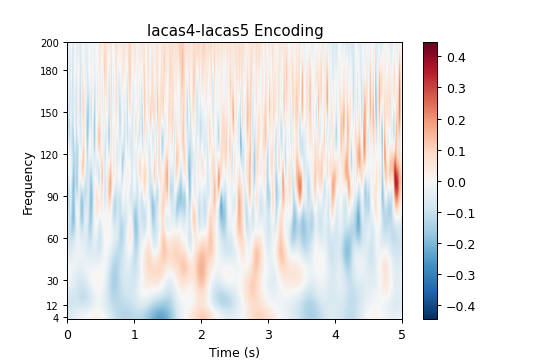

<IPython.core.display.Javascript object>


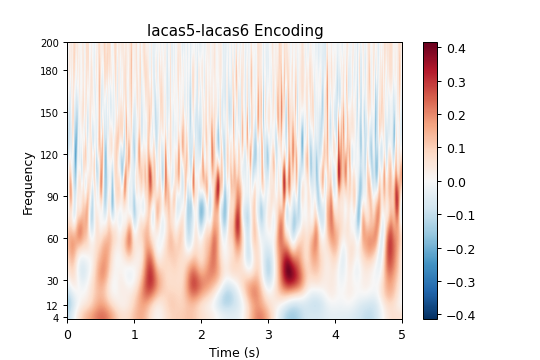

<IPython.core.display.Javascript object>


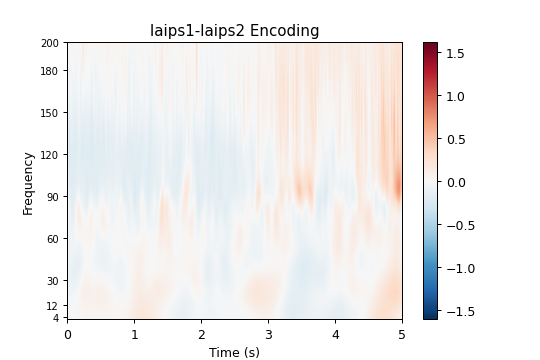

<IPython.core.display.Javascript object>


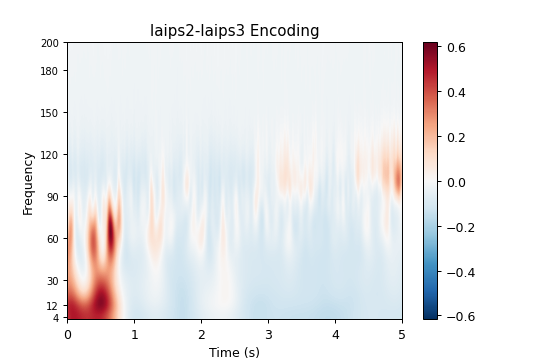

<IPython.core.display.Javascript object>


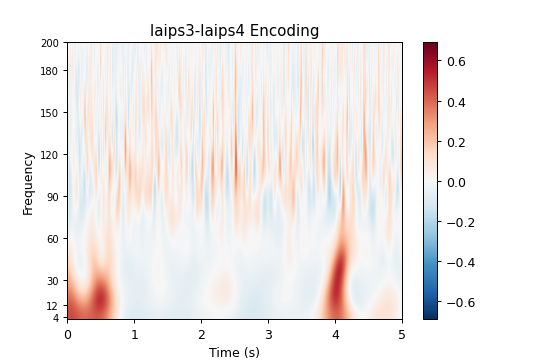

<IPython.core.display.Javascript object>


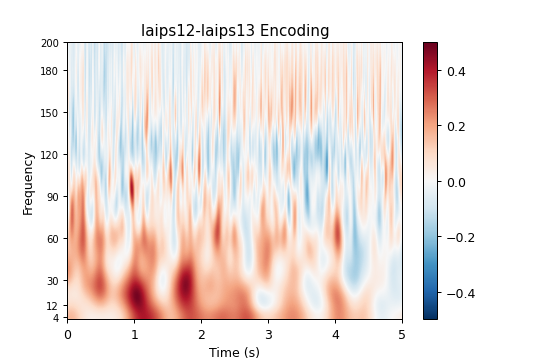

<IPython.core.display.Javascript object>


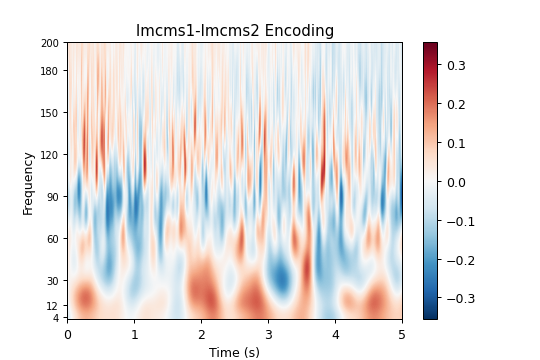

<IPython.core.display.Javascript object>


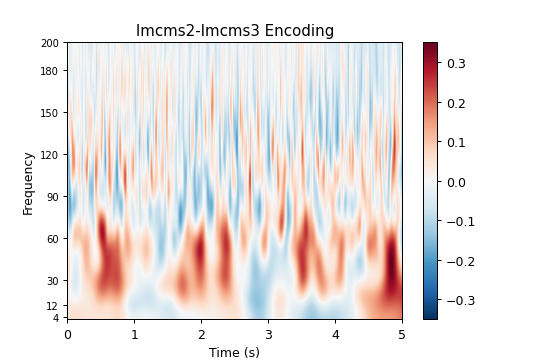

<IPython.core.display.Javascript object>


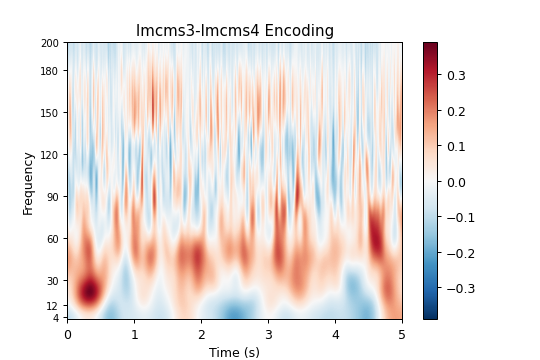

<IPython.core.display.Javascript object>


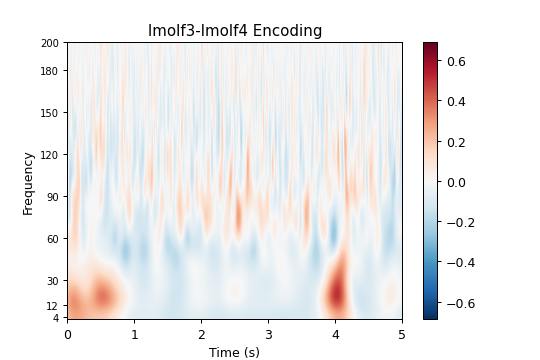

<IPython.core.display.Javascript object>


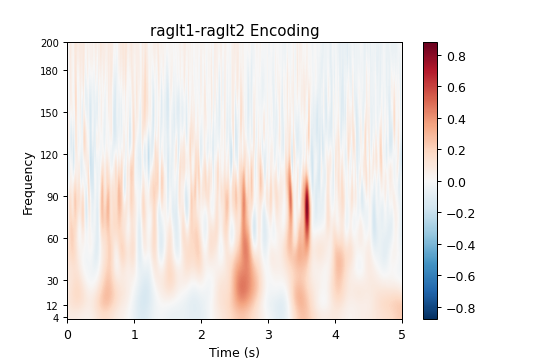

<IPython.core.display.Javascript object>


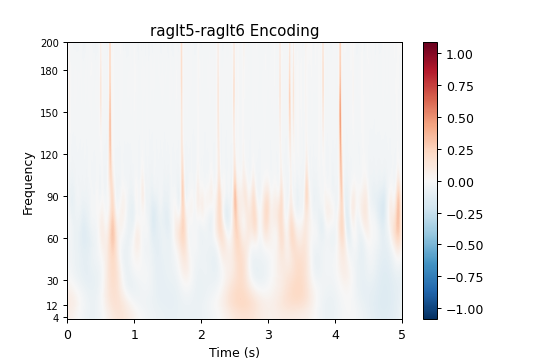

<IPython.core.display.Javascript object>


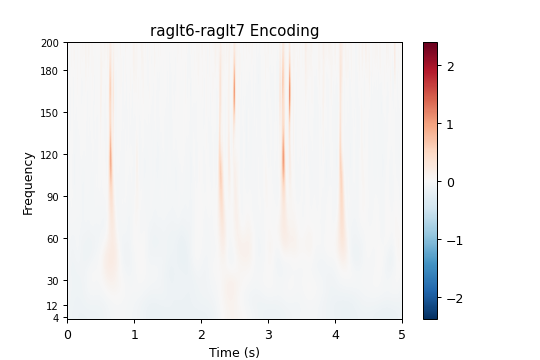

<IPython.core.display.Javascript object>


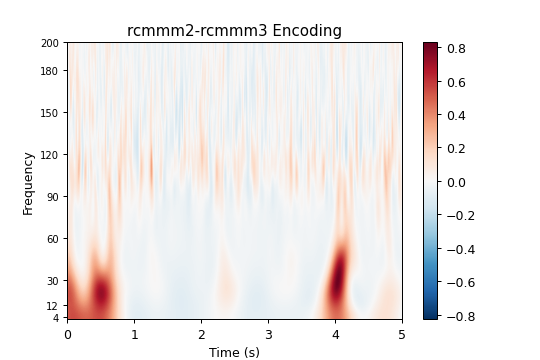

<IPython.core.display.Javascript object>


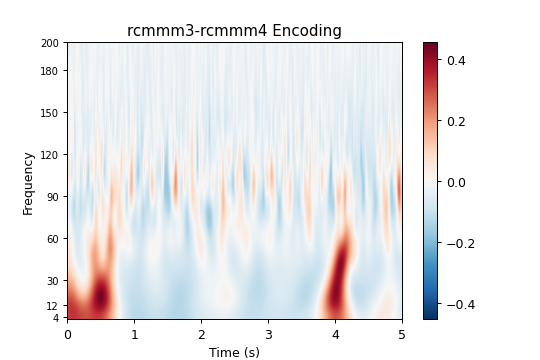

<IPython.core.display.Javascript object>


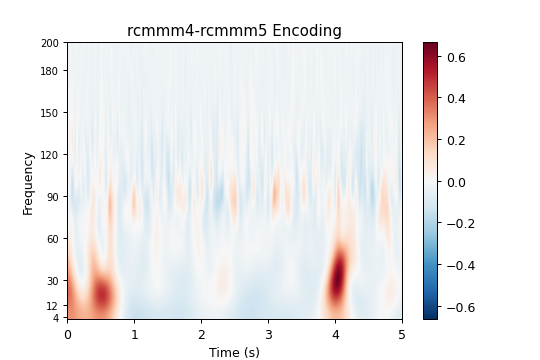

<IPython.core.display.Javascript object>


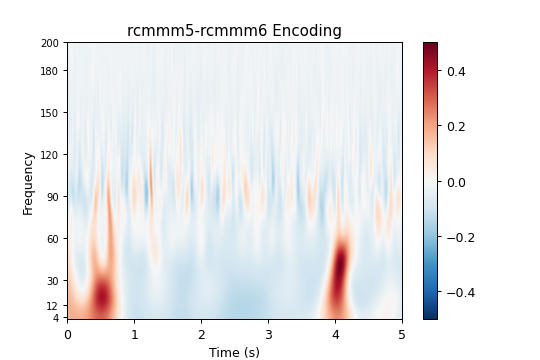

<IPython.core.display.Javascript object>


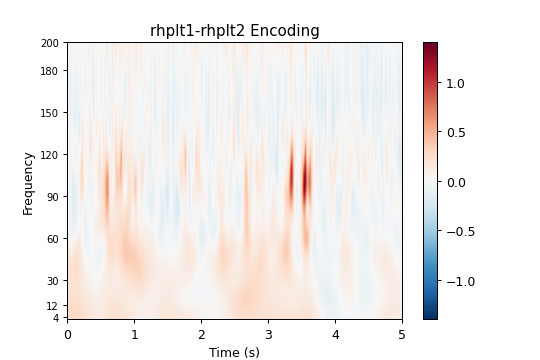

<IPython.core.display.Javascript object>


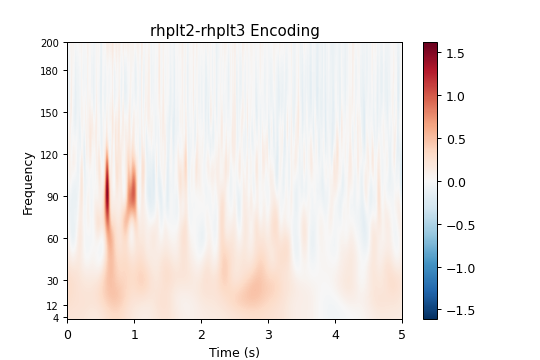

<IPython.core.display.Javascript object>


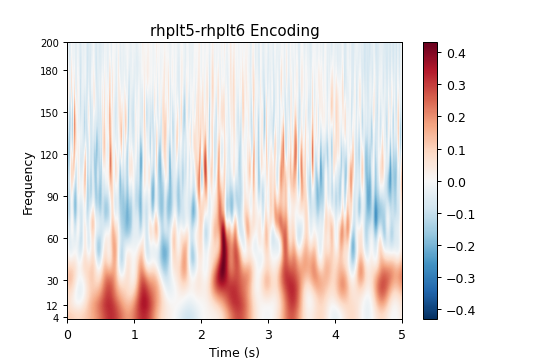

<IPython.core.display.Javascript object>


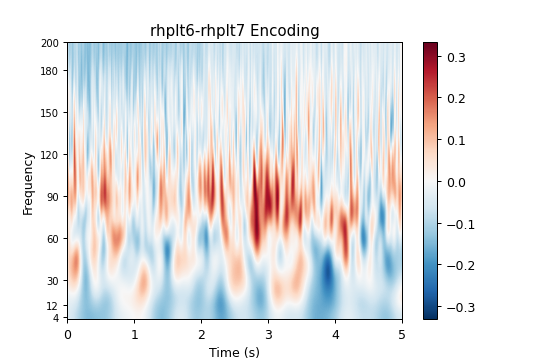

<IPython.core.display.Javascript object>


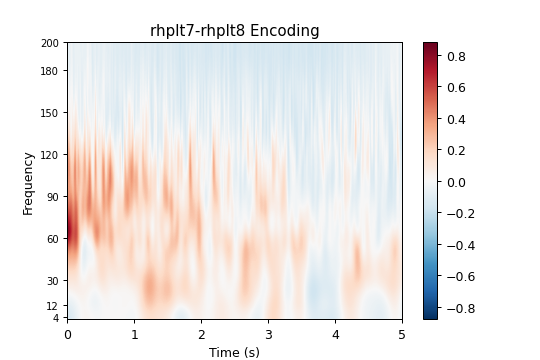

<IPython.core.display.Javascript object>


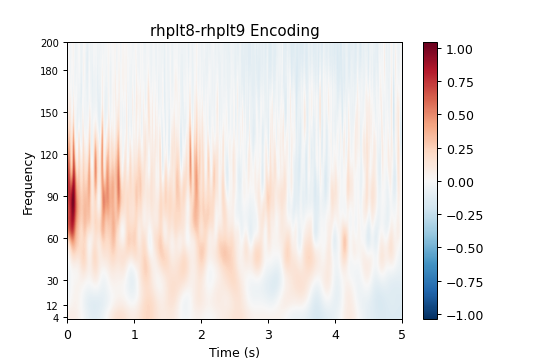

<IPython.core.display.Javascript object>


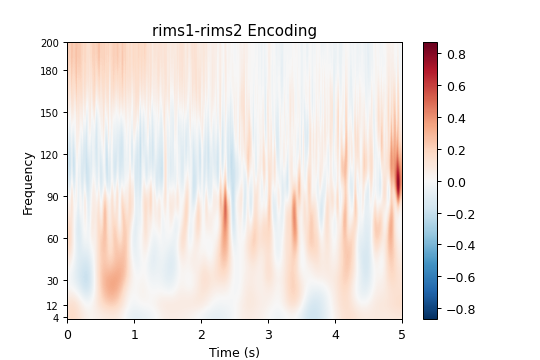

<IPython.core.display.Javascript object>


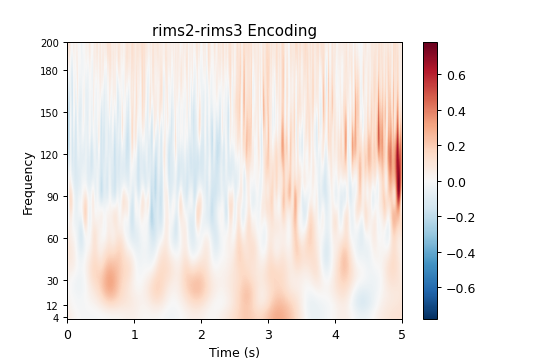

<IPython.core.display.Javascript object>


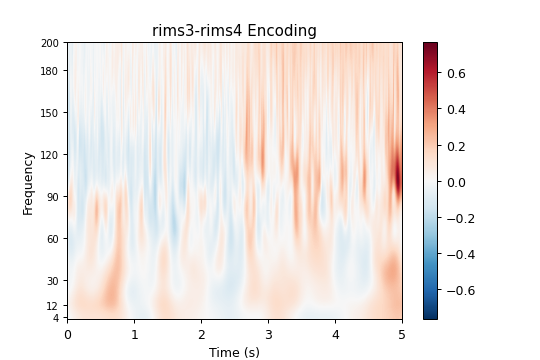

<IPython.core.display.Javascript object>


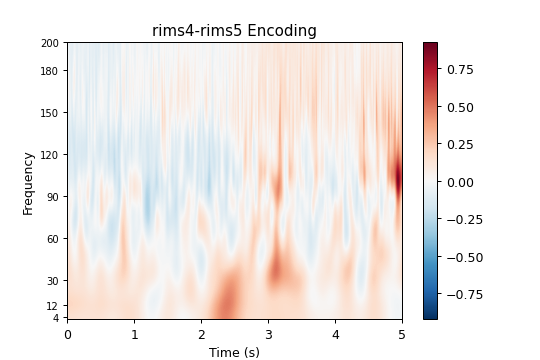

<IPython.core.display.Javascript object>


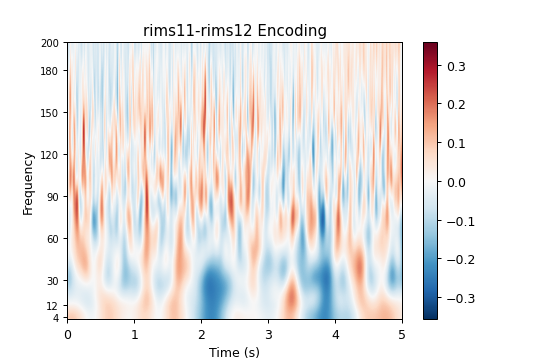

<IPython.core.display.Javascript object>


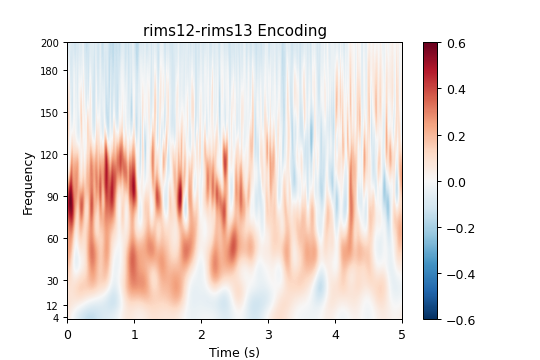

<IPython.core.display.Javascript object>


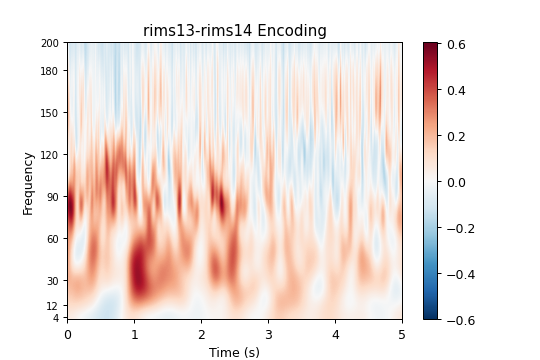

<IPython.core.display.Javascript object>


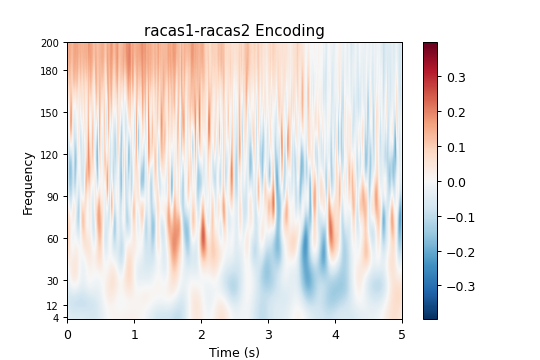

<IPython.core.display.Javascript object>


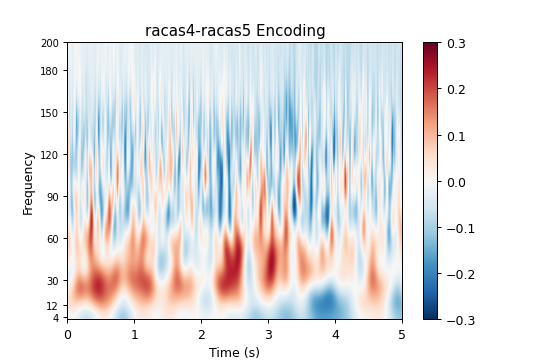

<IPython.core.display.Javascript object>


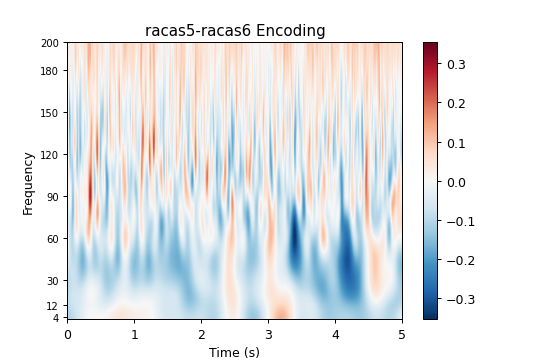

<IPython.core.display.Javascript object>


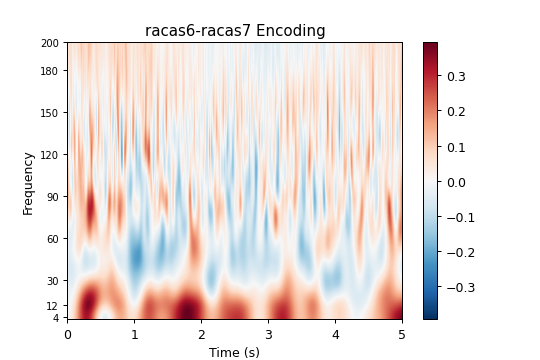

<IPython.core.display.Javascript object>


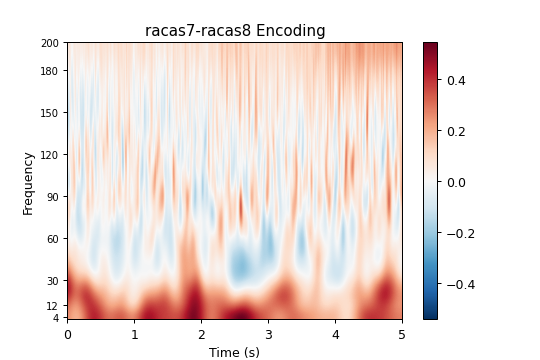

<IPython.core.display.Javascript object>


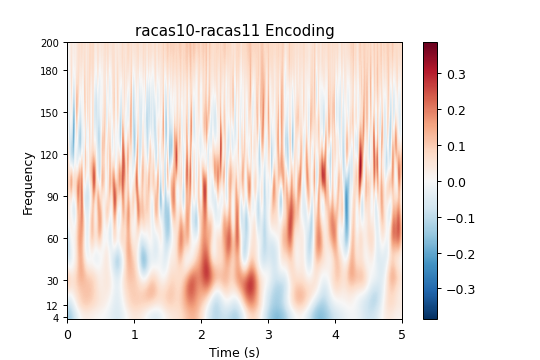

<IPython.core.display.Javascript object>


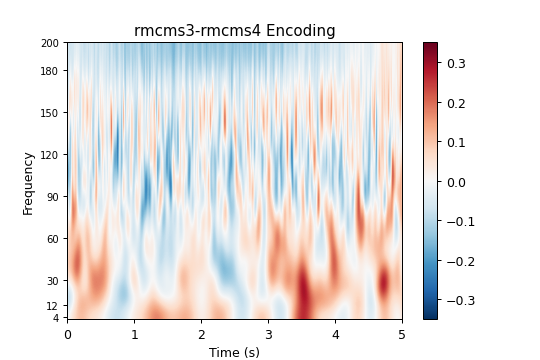

<IPython.core.display.Javascript object>


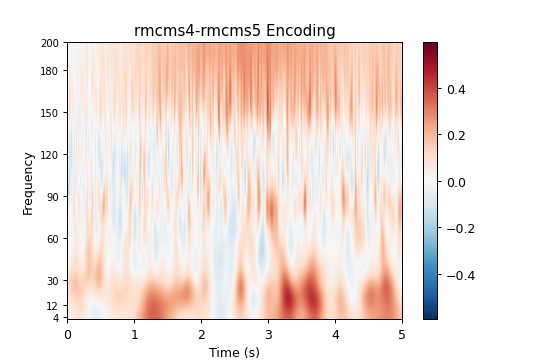

<IPython.core.display.Javascript object>


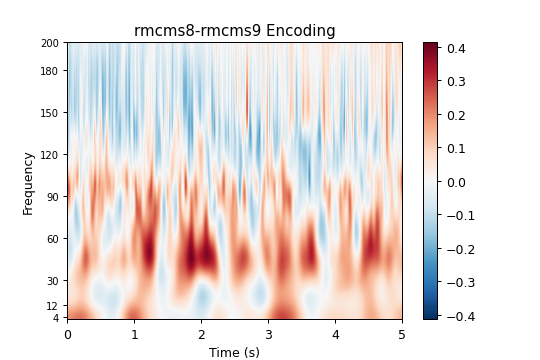

<IPython.core.display.Javascript object>


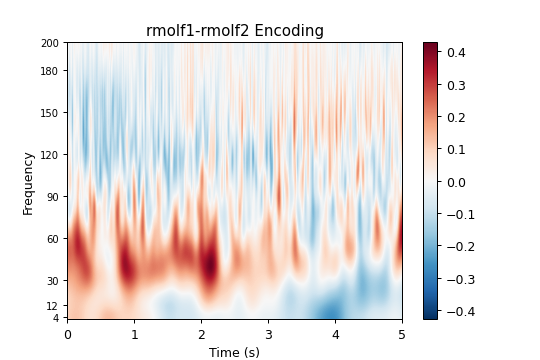

<IPython.core.display.Javascript object>


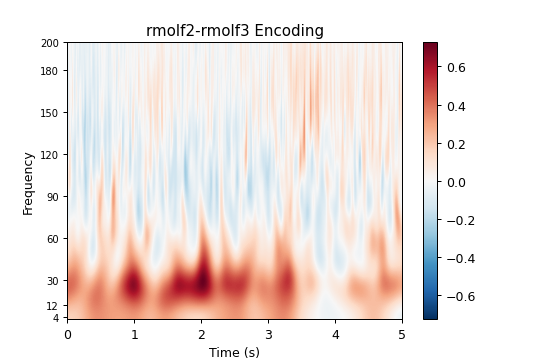

<IPython.core.display.Javascript object>


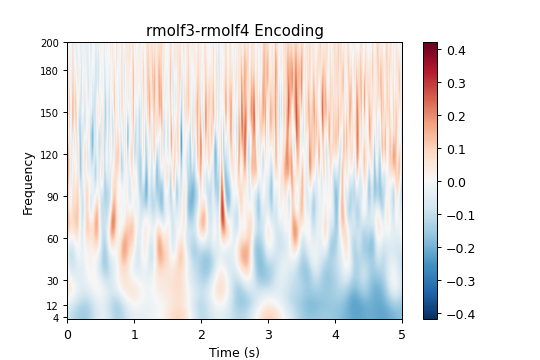

<IPython.core.display.Javascript object>


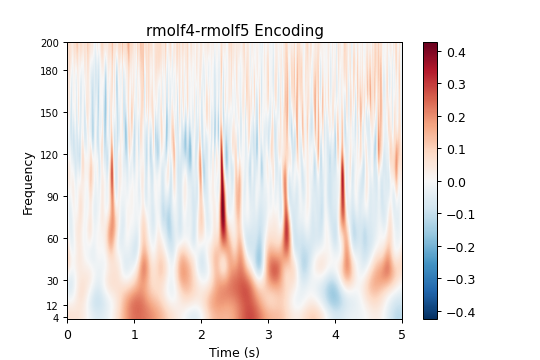

In [232]:
event = 'DecisionOnset'
yticks = [4, 12, 30, 60, 90, 120, 150, 180, 200]
good_ch = [x for x in power_epochs[event].ch_names if '-' in x]
save_path = tfr_dir

print(offset)


for ch in good_ch:
    fig, ax = plt.subplots(1, 1, figsize=(6, 4))
    times = power_epochs[event].times
    plot_data = np.nanmean(np.nanmean(power_epochs[event].copy().pick_channels([ch]).data, axis=0), axis=0)

    im = ax.imshow(plot_data,
            extent=[times[0], times[-1], freqs[0], freqs[-1]], interpolation='Bicubic',
            aspect='auto', origin='lower', cmap='RdBu_r',vmin = -np.nanmax(np.abs(plot_data)), vmax = np.nanmax(np.abs(plot_data)))
    ax.set(yticks=yticks, xlabel='Time (s)', ylabel='Frequency',title=f'{ch} Encoding')
    ax.yaxis.set_tick_params(labelsize=8)
    fig.colorbar(im, ax=ax)
    plt.savefig(f'{save_path}/{ch}_{date}_bp_ref.png', format='png', metadata=None,
    bbox_inches=None, pad_inches=0.1,
    facecolor='auto', edgecolor='auto',
    backend=None)
#     plt.close()
